## Exercise 1. Image clustering

In this assignment, you will explore the process of image clustering
using hierarchical clustering. Hierarchical clustering is a method of cluster analysis which seeks to
build a hierarchy of clusters. You will employ various similarity metrics to quantify the similarity
between images and cluster them accordingly.

### Data Preparation:
You are provided with a folder containing multiple images, see dataset
https://www.kaggle.com/datasets/pavansanagapati/images-dataset or other dataset that has at
least 200 files and the domain is similar with these ones. The dataset must be selected from either
Kaggle or Hugging Face (https://huggingface.co/).
Load the images from the folder and prepare them for clustering.

### Hierarchical Clustering:
Implement hierarchical clustering on the images.
Utilize different linkage methods such as single, complete, or average linkage.
Experiment with various distance metrics to measure similarity between images. Some pertinent
metrics include Euclidean distance, cosine similarity, Manhattan distance, Correlation distance,
Hamming distance (for binary images), SSIM etc.
Choose appropriate metrics based on the characteristics of the images and observe how they
affect clustering results.

### Analysis:
Analyze the number of clusters formed under different configurations.
Comment on the observations: Do you notice any patterns or structures in the clusters?
How does the choice of distance metric influence the clustering outcome?
Compare and contrast the results obtained with different linkage methods.
Discuss any challenges encountered during the clustering process and possible solutions.

### Conclusion:
Summarize your findings and conclusions regarding the effectiveness of hierarchical
clustering for image clustering. Reflect on the importance of selecting appropriate distance
metrics and linkage methods for clustering tasks.
Suggest potential areas of improvement or further research.

### Deliverables:
Python code implementing the hierarchical clustering process.
Report containing detailed analysis, observations, and conclusions (summarizing key findings and
insights)



## Read and display the images

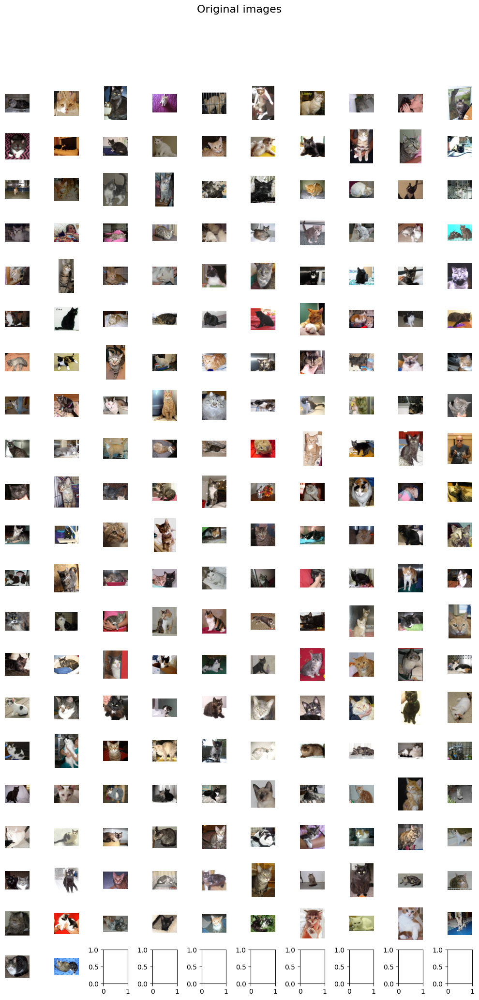

In [ ]:
from skimage.io import imread
from skimage.color import rgba2rgb
import glob # for pathname pattern expansion
import matplotlib.pyplot as plt

originalImages = []

# Load the images
imagesPath = "./datasets/cats/"
for imageFilePath in glob.glob(imagesPath + "*"):
    image = imread(imageFilePath)
    # If ncessary, convert RGBA to RGB
    if image.ndim == 3 and image.shape[2] == 4:
        image = rgba2rgb(image)
    originalImages.append(image)

# Plot the original images:
# Determine grid size (number of rows and columns), this is for display only
imageGridColumns = 10 # We choose a suitable number of columns

# And from that we determine the corresponding number of rows
imageGridRows = (len(originalImages) + imageGridColumns - 1) // imageGridColumns
# The display size of plotted images
imageDisplayWidth = 1
imageDisplayHeight = 1

# Create a plot containing multiple subplots, where the nnumber of subplots will be the number of images
figure, axes = plt.subplots(imageGridRows,
                            imageGridColumns,
                            figsize = (imageDisplayWidth * imageGridColumns, imageDisplayHeight * imageGridRows))

figure.suptitle("Original images", fontsize=16)

# Add each image to a subplot
index = 0
for i in range(imageGridRows):
    for j in range(imageGridColumns):
        if index < len(originalImages):
            axes[i, j].imshow(originalImages[index], cmap="gray")
            axes[i, j].axis("off")
            index += 1
        else:
            break

plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

## Extract relevant information from images - Feature extraction
In order to cluster images togheter, we need to use some representation of those images which can be used to group the images. Such a representation could be the actual pixels of the images, but the pixels of the images also contain background objects or landscapes and other irelevant data. Also, the software does not understand the meaning of the pixels (it doesn't understand what objects those pixels depict), unless we use an image recognition library, which might not be able to recognize the important objects in the images anyway and/or it might require a long time to compute.

Another way is to try to extract the relevant information from the images and use only that information for grouping images into clusters. This is called **feature extraction** and can be used to obtain a more accurate clustering of images and any other type of data.

For feature extraction, the **Histogram of Oriented Gradients** (HOG) is used. For obtaining HOG functionality, the **Scikit-image** library is used. **Scikit-image** computes the **gradient** of the image and applies many other operations to obtain an array of vectors which defines the main lines/shapes of that image.

<img src="documentation/scikit-hog-example.png">

Image source: [scikit-image](https://scikit-image.org/docs/stable/auto_examples/features_detection/plot_hog.html)

The scikit-image `hog()` function will divide the image into cells of equal size. The `hog()` function will compute the gradients for each cell.

For each cell, the gradients of that cell will form the histogram of the cell. The histograms of all the cells of an image will be **feature vector** (feature descriptor) of that image.

Before we apply the HOG to each image, we first convert each image to grayscale. This is done for several reasons:
* **Color does not influence gradient values, intensity does**. The gradient represent a local change in value (in brightness). All 3 RGB channels have very similar brightness variations, so it's not necessary to compute the gradient for each RGB channel.
* **To obtain low-dimensionality and better performance**. If the histograms are computed for each RGB channel, then this would triple the length of the feature vector, use more memory and more CPU.
* **Industry convention**. Most HOG variations use grayscale images and libraries expect grayscale images also.

The hog() function from the *Scikit-image* library accepts many arguments and the most important are:
* **image**: the image to which the HOG algorithm is being applied to
* **orientations**: the number of values that the gradient angles can take; for example, a value of 8 would many that the range of possible angles (0...180&deg;) will be divided into 8 parts and only 8 possible angles will be taken into account, the gradients will not be computed for other angles. A value between 9 and 12 is recomended.
* **pixels_per_cell**: the number of pixels in each cell, where a cell is a division of the original image
* **cells_per_block**: to take into account changes in contrast and illumination, the gradient values can be normalized and for this, multiple cells are grouped togheter into a small matrix and their values are averaged. The small matrices are called *blocks* and these blocks traverse all the cells of the image, like in the animation below. A value between (1, 1) and (3, 3) is recomended.

<img src="documentation/hog_contrast_normalization.gif">

Image source: [PyImageSearch](https://customers.pyimagesearch.com/lesson-sample-histogram-of-oriented-gradients-and-car-logo-recognition/)

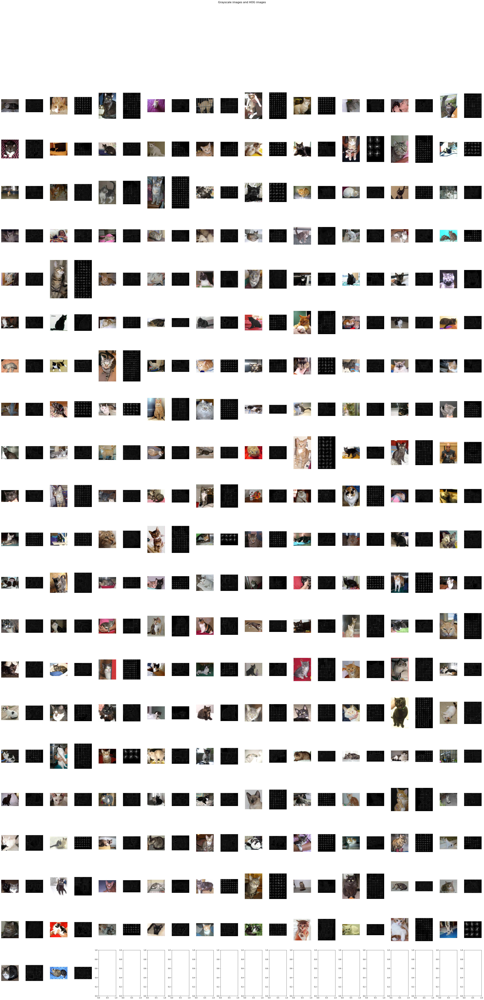

In [28]:
from skimage.color import rgb2gray
from skimage.feature import hog
from skimage.exposure import equalize_adapthist # for improving the contrast of gradient images

grayscaleImages = []
hogImages = []
featureVectors = []

# Covert original images to grayscale and apply HOG
for image in originalImages:
    if image.ndim == 3:
        image = rgb2gray(image)

    grayscaleImages.append(image)

    featureVector, hogImage = hog(image,
                             orientations=12,
                             pixels_per_cell=(32, 32),
                             cells_per_block=(2, 2),
                             visualize=True)

    # Populate the list of HOG images (this is for display purposes)
    hogImages.append(hogImage)

    # Populate the 'feature vector' ('feature descriptor') list.
    # The 'feature vector' is basically the abstract representation of a single image.
    # The feature vectors will be used to calculate the similarity (distance) between images.
    featureVectors.append(featureVector)

# Determine grid size (number of rows and columns), this is for display only.
# We choose a suitable number of columns
hogGridColumns = 10
# And from the number of columns we determine the corresponding number of rows
hogGridRows = (len(originalImages) + hogGridColumns - 1) // hogGridColumns

# The dimensions of the plotted images
hogDisplayWidth = 4
hogDisplayHeight = 4

# Plot original images and HOG images
hogFigure, hogAxes = plt.subplots(hogGridRows,
                                  hogGridColumns * 2,
                                  figsize=(hogDisplayWidth * hogGridColumns, hogDisplayHeight * hogGridRows))

hogFigure.suptitle("Grayscale images and HOG images", fontsize=16)

index = 0
for indexA in range(imageGridRows):
    for j in range(imageGridColumns):
        if index < len(originalImages):
            hogAxes[indexA, j * 2].imshow(originalImages[index], cmap="gray")
            hogAxes[indexA, j * 2].axis("off")

            # hogImage = rescale_intensity(hogImage, in_range="image", out_range=(0, 1))
            hogImageEnhanced = equalize_adapthist(hogImages[index], clip_limit=0.2)
            hogAxes[indexA, j * 2 + 1].imshow(hogImageEnhanced, cmap="gray")
            hogAxes[indexA, j * 2 + 1].axis("off")
            index += 1
        else:
            break

plt.tight_layout()
plt.subplots_adjust(top=0.9)
# Display the original images alongside their gradient.
# Note: in order to view larger images, please maximize the IDE.
plt.show()

Note: the resulting images might look small but in reality they are much larger than they appear. In order to view the images properly, the IDE should be maximized as much as possible. 

## Making the feature vectors the same size
The feature vectors obtained previously are bassicaly arrays of diferent lengths.

Their lenght is different because the images are also of different size, so the smaller images will generate fewer gradients (and a feature vector with fewer elements) and the larger images will generate more gradients (and a feature vector with more elements).

But some distance metrics which are quite usefull for image clustering, such as Jensen-Shannon, can only compute a distance between two vectors of the same size.

This is why, before trying to compute the distances, we will make all feature vectors have the same length, by padding the shorter vectors (arrays) with zeros.

In [29]:
# Determine the longest size of all vectors
maxLength = 0
currentLength = 0
for featureVector in featureVectors:
    currentLength = len(featureVector)
    if currentLength > maxLength:
        maxLength = currentLength 

# Pad all vectors with zeros, so that they all have the same length
paddedFeatureVectors = []
paddingLength = 0
for featureVector in featureVectors: # For each feature vector
    # Check if the current feature vector is shorter than the longest one
    if len(featureVector) < maxLength:
        # Determine how many extra zeroes are needed for padding
        paddingLength = maxLength - len(featureVector)

        # Then pad feature vector with extra zeroes
        featureVector = np.pad(featureVector, (0, paddingLength), mode="constant")

    # Add the final feature vector to the final list
    paddedFeatureVectors.append(featureVector)

# Stack the feature vectors into a 2D array
featureVectors2D = np.stack(paddedFeatureVectors)

# Optionally, normalize each row of the 2D array so that the sum of it's elements is 1.
# Normalization is recomended, because the Jensen-Shannon distance is defined between probability
# distributions. Also, if the feature vectors are histograms, they should be converted to
# probabilities, meaning that their sum of the elements in each vector should be 1.
# First, we obtain the array of sums for each row, this will be a 1-dimensional array
rowsSums1D = featureVectors2D.sum(axis=1, keepdims=True)
# Second, we divide the matrix (array of rows) to the array of sums (for each row), so
# that we normalize each row
featureVectors2D = featureVectors2D / rowsSums1D

## Distance measurement

Once the feature vectores are colected and stored, the next step is to compare the vectors with each other and calculate their similarity (their "distance"). For this we can use **distance functions**.

### Distance matrix
The distance matrix is a square matrix containing all the distances between a pair of items, for all possible pair combinations. In this particular case, the distance matrix will be symmetrical around it's diagonal, because the distance from vector A to vector B will be the same as the distance from vector B to vector A (as this point, we are representing images as feature vectors). Also, the diagonal of this distance matrix will be 0, because the distance from a vector to itself is zero.

For performing actual hierarchical clustering, the `linkage()` function from `scipy.cluster.hierarchy` will be used. This function expects a *condensed* matrix, so this is why we use the `pdist()` convenience function, which computes the distances between each pair of vectors by a specific metric but also returns a *condensed* matrix.

A *condensed matrix* is a matrix that only containes the upper-right triangle of the matrix, whithout its diagonal. The *condensed matrix* is also flattened, so it's no longer a true bi-dimensional array, it will be a one-dimensional array.

In [30]:
from scipy.spatial.distance import pdist

# Compute the distance matrix.
# Determine the 'condensed' version of the feature vectors, lenght = n*(n-1)/2.
# This is a flat array version of the matrix, which contains only the upper triangular half
# of the matrix.
condensedDistanceMatrix = pdist(featureVectors2D, metric="jensenshannon")

## Hierarchical clustering
There are two main methods of creating a hierarchy of clusters:
* Agglomerative (bottom-up approach): each item starts with it's own cluster and the two nearest items are clustered. As we move up the hierarchy, pairs of clusters are merged. This continues untill all elements form a single set.
* Divider (top-down approach): The entire item set starts out as a single set. As we move down the hierarchy, cluster split into more homogenous clusters and so on, until only one element remains in each cluster.

Here we will be using the agglomerative (bottom-up) approach. The `linkage()` function from scipy library is used for this method. The function accepts as input a 1D condensed distance matrix or a 2D array of observation vectors. The `linkage()` returns a matrix usually named Z, of size (n-1)x4.

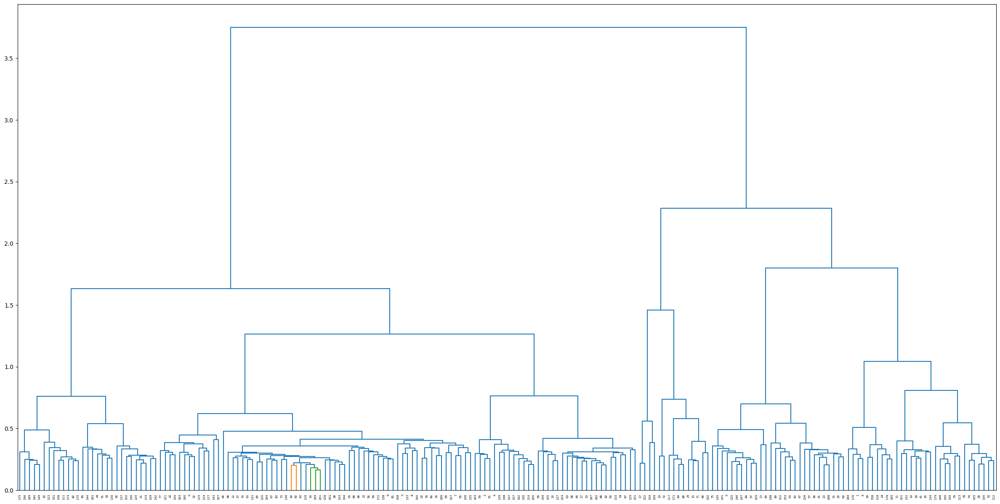

In [31]:
from scipy.cluster.hierarchy import linkage # performs hierarchical/agglomerative clustering
from scipy.cluster.hierarchy import dendrogram

# Perform hierachical clustering, this is the main result of this program
Z = linkage(condensedDistanceMatrix, method="ward")

# Draw dendrogram, but without leaf labels
plt.figure(figsize=(30, 15))
leaves = dendrogram(Z,
                    color_threshold=0.2,
                    no_labels=False,
                    show_leaf_counts=True)

# Display dendrogram, this is the final result of HOG algorithm
plt.show()

## Comparing various distance metrics and linkage methods
For the same dataset, we group try to cluster the dataset images, each time selecting different **similarity metrics** and **linkage methods**.

The similarity metrics used are: city block (Manhattan), cosine, correlation, euclidean, Hamming, Jensen-Shannon.

The cluster linkage methods used are:
* single linkage: the distance between two clusters is the minimum distance between different items from each cluster

<img src="documentation/single-linkage.png">

* complete linkage: the distance between two clusters is the maximum distance between diferrent items from each cluster

<img src="documentation/complete-linkage.png">

* average linkage: the distance between two clusters is the average distance between different items from each cluster

<img src="documentation/average-linkage.png">

* centroid linkage: the distance between two clusters is the distance between each cluster's centroid or mean

<img src="documentation/centroid-linkage.png">

* Wards's linkage: the distance between two clusters is the sum of squared deviations from items to centroids. The objective of Ward's method is to minimize the sum of squares inside a cluster. This method is more robust against outliers and noise.

<img src="documentation/ward-linkage.png">

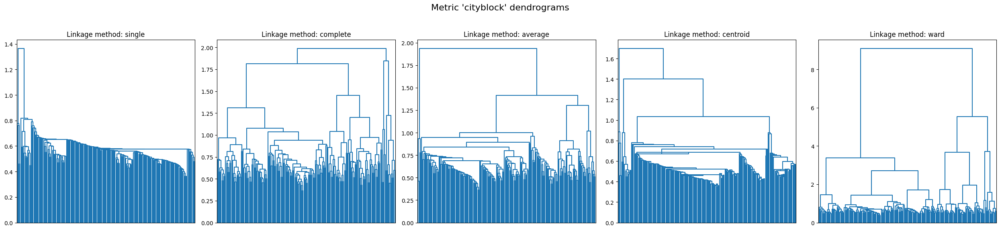

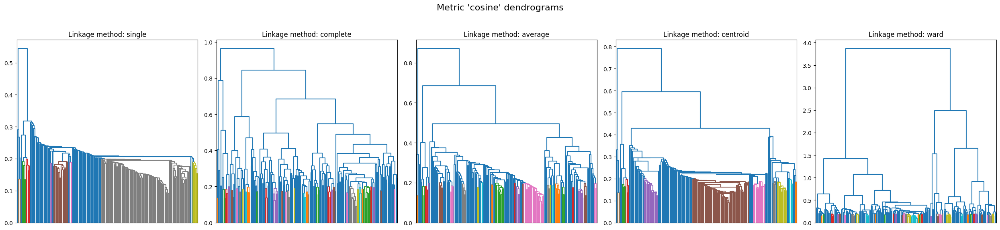

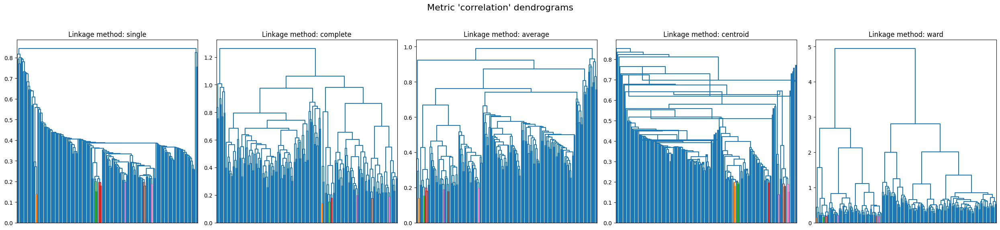

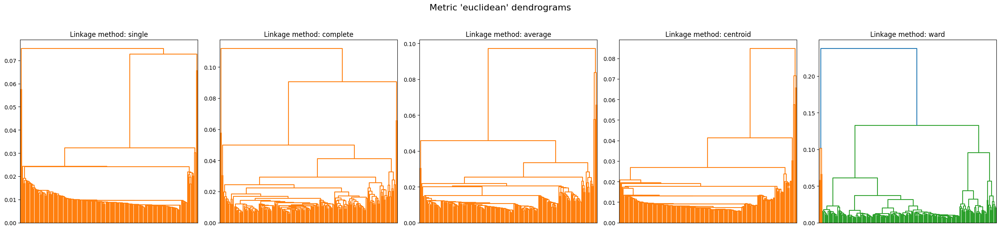

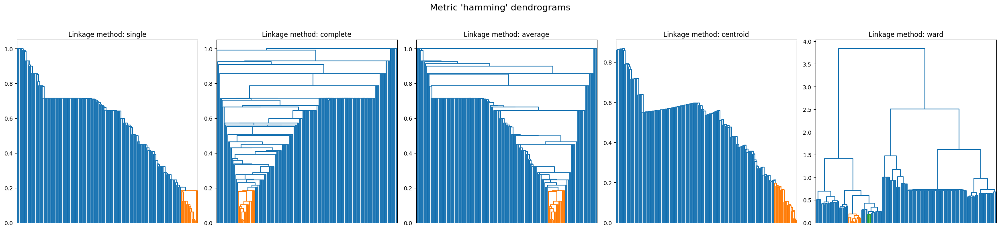

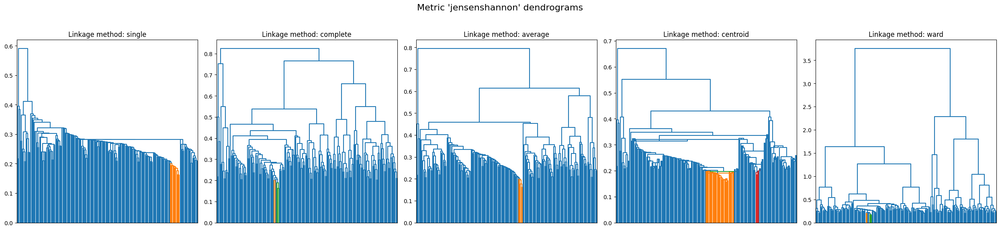

In [25]:
from scipy.cluster.hierarchy import linkage # performs hierarchical/agglomerative clustering
from scipy.cluster.hierarchy import dendrogram

# Define the possible metrics and linkage methods
metrics = ["cityblock", "cosine", "correlation", "euclidean", "hamming", "jensenshannon"]
linkageMethods = ["single", "complete", "average", "centroid", "ward"]

# For each metric
for metric in metrics:
    # Compute the distance matrix only once per type of metric. This improves performance.
    condensedDistanceMatrix = pdist(featureVectors2D, metric=metric)

    # Create a large plot for the current 'metric'.
    # This plot wiil be associated to the current 'metric' only and will contain subplots
    # for each 'linkage method'.
    nrows = 1
    ncols = len(linkageMethods)
    mainFigure, mainAxis = plt.subplots(nrows, ncols, figsize=(5 * len(linkageMethods), 6))
    mainFigure.suptitle(f"Metric '{metric}' dendrograms", fontsize=16)

    # For each linkage method, obtain the dendrogram data
    for axis, linkageMethod in zip(mainAxis, linkageMethods):
        # Perform hierachical clustering, this is the main result of this program
        Z = linkage(condensedDistanceMatrix, method=linkageMethod)

        # Draw dendrogram
        leaves = dendrogram(Z,
                            color_threshold=0.2,
                            no_labels=True,
                            show_leaf_counts=True,
                            ax=axis)
        axis.set_title(f"Linkage method: {linkageMethod}")

    # Display dendrogram, this is the final result of HOG algorithm.
    plt.tight_layout(rect=(0, 0.03, 1, 0.95)) # We adjust the layout
    plt.show()

## Final conclusions

1. Influence of linkage method:
* **Single linkage** always leads to chaining, irespective of the linkage method
* **Complete linkage** generates a much denser hierarchy of clusters than **single linkage**
* **Average linkage** generates a hierarchy of clusters of density between **single linkage** and **complete linkage**
* **Centroid linkage** can invert the hierachy of clusters
* **Ward's linkage** generates very compact and almost equal-size clusters. This linkage method is usually recommended to be used with the **euclidean metric**, but we can observe that the result are almost the same for other metrics as well.

2. Influence of distance metric:
* **Cityblock (Manhattan) metric** generates "diamond-like" and "stairstep" patterns, meaning that the clusters are axis-aligned
* **Cosine metric**
* **Euclidean metric** generates compact clusters and of similar size
* **Hamming metric** generates coarse clusters